<a href="https://colab.research.google.com/github/Fadora/diplomatervezes2024/blob/figshare_brain_tumor_reading_selecting/BrainTumorDataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [25]:
pip install -q kaggle


In [26]:
pip install mat73

In [67]:
import os
import numpy as np
from PIL import Image
from mat73 import loadmat
import matplotlib.pyplot as plt
import cv2
import h5py
from skimage.transform import resize

In [4]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"drafbin","key":"996fb26f38991862b6f5042a92223973"}'}

In [5]:
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [7]:
!kaggle datasets download -d ashkhagan/figshare-brain-tumor-dataset

 99% 833M/839M [00:11<00:00, 106MB/s]
100% 839M/839M [00:11<00:00, 74.1MB/s]


In [9]:
!unzip figshare-brain-tumor-dataset.zip

Archive:  figshare-brain-tumor-dataset.zip
  inflating: dataset/README.txt      
  inflating: dataset/cvind.mat       
  inflating: dataset/data/1.mat      
  inflating: dataset/data/10.mat     
  inflating: dataset/data/100.mat    
  inflating: dataset/data/1000.mat   
  inflating: dataset/data/1001.mat   
  inflating: dataset/data/1002.mat   
  inflating: dataset/data/1003.mat   
  inflating: dataset/data/1004.mat   
  inflating: dataset/data/1005.mat   
  inflating: dataset/data/1006.mat   
  inflating: dataset/data/1007.mat   
  inflating: dataset/data/1008.mat   
  inflating: dataset/data/1009.mat   
  inflating: dataset/data/101.mat    
  inflating: dataset/data/1010.mat   
  inflating: dataset/data/1011.mat   
  inflating: dataset/data/1012.mat   
  inflating: dataset/data/1013.mat   
  inflating: dataset/data/1014.mat   
  inflating: dataset/data/1015.mat   
  inflating: dataset/data/1016.mat   
  inflating: dataset/data/1017.mat   
  inflating: dataset/data/1018.mat   
  infla

In [11]:
#import os;

#current_directory = os.getcwd()
#print("Current directory:", current_directory)

Current directory: /content


In [ ]:
import zipfile

# Path to the zip file
zip_file_path = '/content/figshare-brain-tumor-dataset.zip'

# Initialize an empty list to store .mat files
mat_files_list = []

# Open the zip file
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    # Iterate through each file in the zip folder
    for file_info in zip_ref.infolist():
        # Check if the file has a .mat extension
        if file_info.filename.endswith('.mat'):
           if not file_info.filename.startswith('dataset/cvind'):
            # Add the file name to the list
            mat_files_list.append(file_info.filename)

# Print the list of .mat files
print("List of .mat files:")
for file_name in mat_files_list:
    print(file_name)

In [22]:
print(len(mat_files_list))

3064


In [61]:
mat_files_meningioma = [] # 1
mat_files_gliomas = []    # 2 ez kell nekünk alapból
mat_files_pituitary = []  # 3

for i in range(1,len(mat_files_list)+1):
    path = f"dataset/data/{i}.mat"
    data=loadmat(path)
    img=data['cjdata']
    label=img['label']
    if label == 2.0:
      mat_files_gliomas.append(data)


In [62]:
len(mat_files_gliomas)

1426

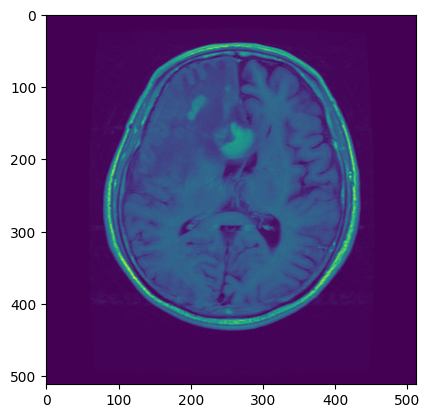

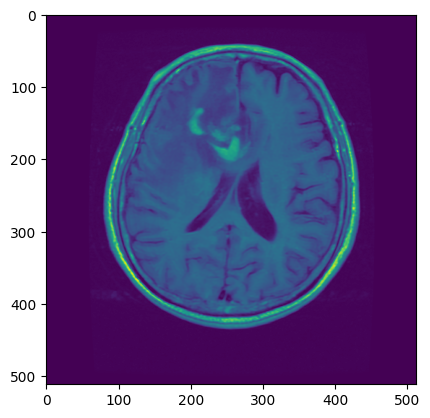

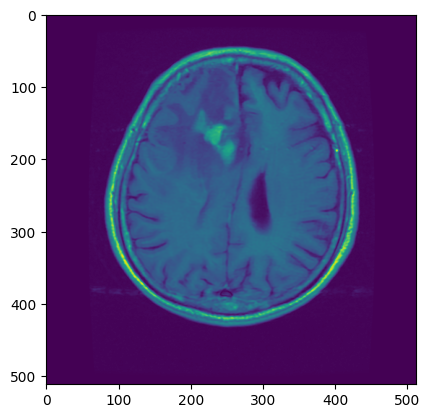

<Figure size 640x480 with 0 Axes>

In [63]:
for i in range(1,4):
    data = mat_files_gliomas[i]
    img = data['cjdata']
    plt.imshow(img['image'])
    plt.figure()

In [71]:
masks = []
len(mat_files_gliomas)
for i in range(len(mat_files_gliomas)):
  mask = mat_files_gliomas[i]["cjdata"]["tumorMask"][()]
  mask = np.expand_dims(resize(mask, (256, 256), mode="constant", preserve_range=True), axis=-1)
  masks.append(mask)

In [72]:
len(masks)

1426

In [73]:
masks=np.array(masks)
print(masks.shape)

(1426, 256, 256, 1)


In [74]:
images = []
for i in range(len(mat_files_gliomas)):
  im = mat_files_gliomas[i]["cjdata"]["image"][()]
  im = np.expand_dims(resize(im, (256, 256), mode="constant", preserve_range=True), axis=-1)
  images.append(im)

print(len(images))

1426


In [75]:
images=np.array(images)
print(images.shape)

(1426, 256, 256, 1)


<ipython-input-78-543a3ac7ab1e>:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, arr = plt.subplots(1,2,figsize=(10, 10))


KeyboardInterrupt: 

Error in callback <function _draw_all_if_interactive at 0x7a91c140d120> (for post_execute):


KeyboardInterrupt: 

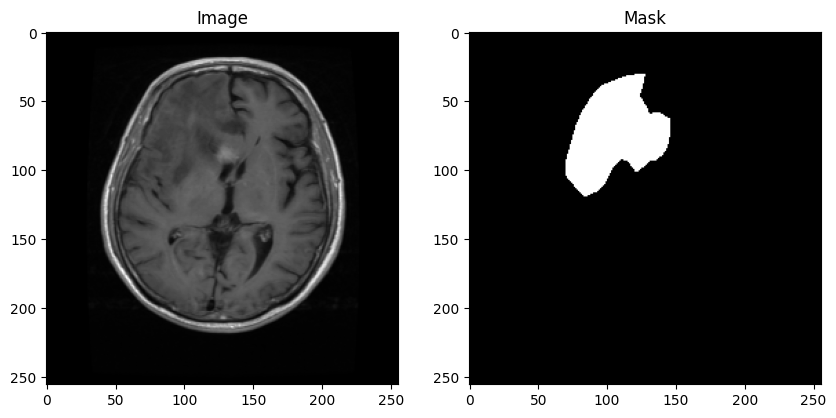

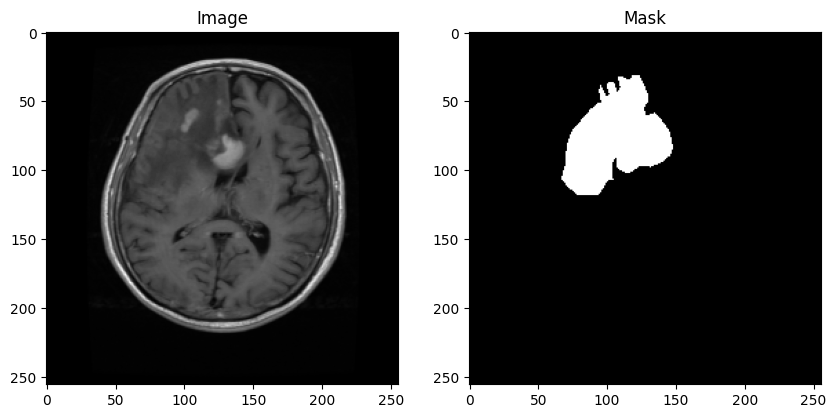

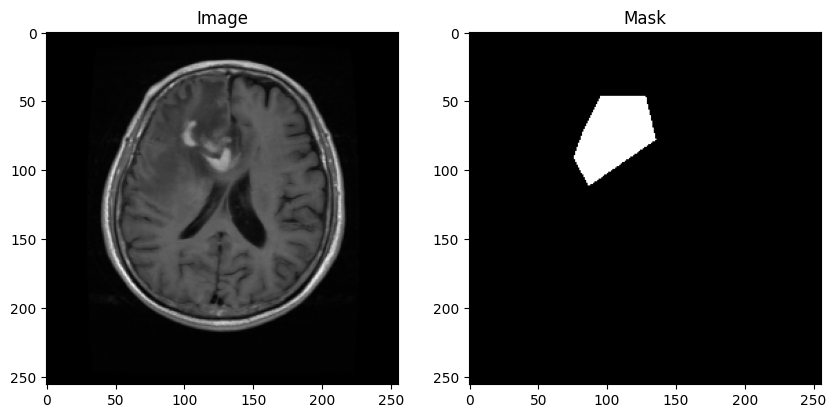

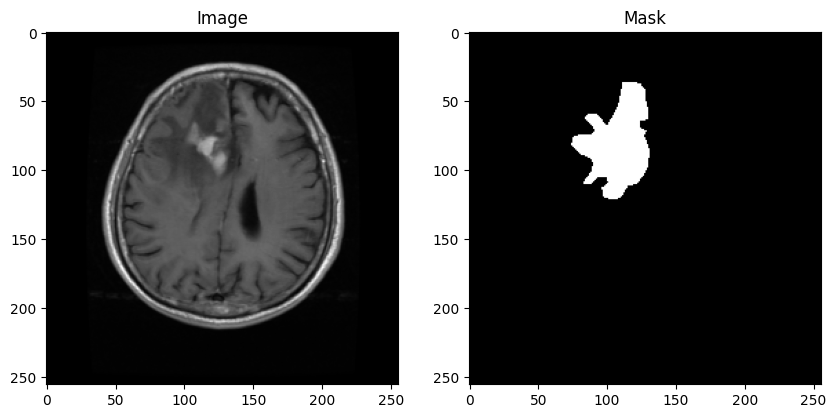

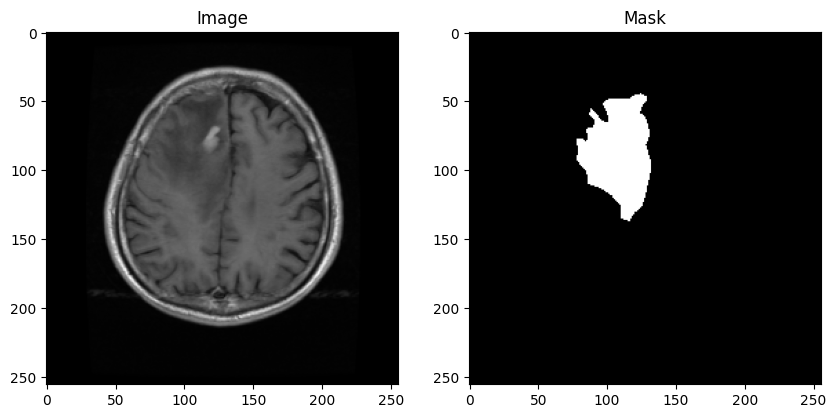

...

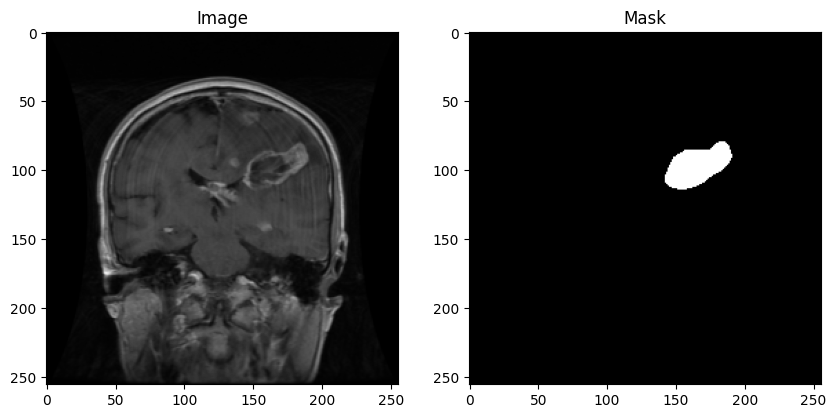

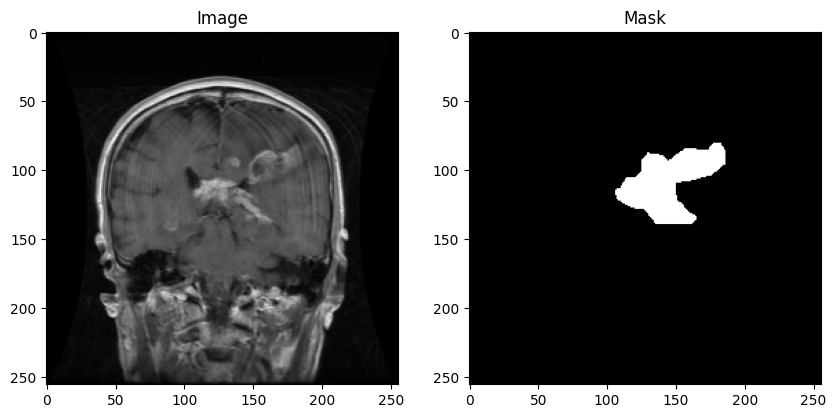

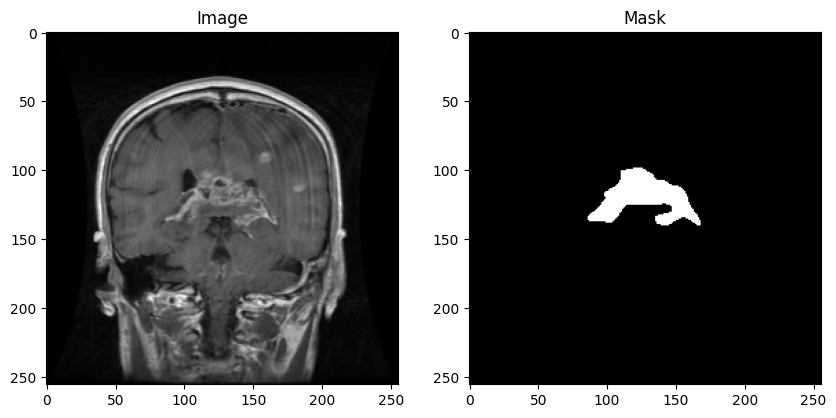

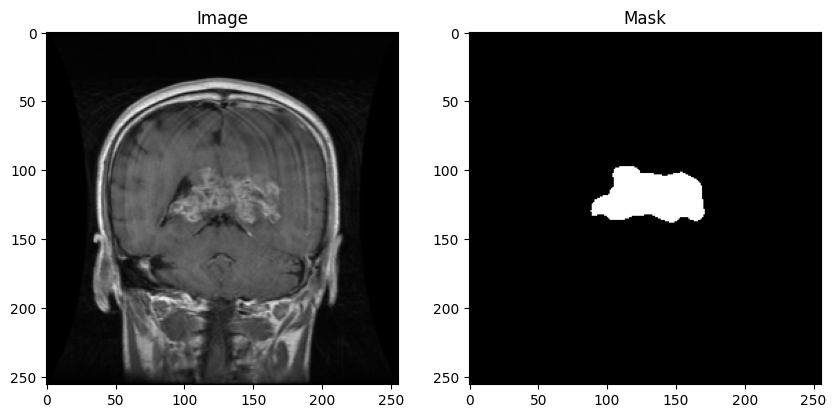

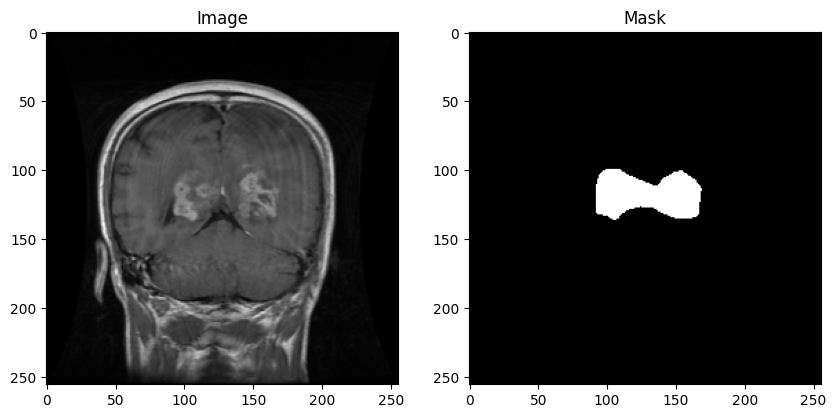

Error in callback <function flush_figures at 0x7a91c140c3a0> (for post_execute):


KeyboardInterrupt: 

In [78]:
for i in range(10):
  fig, arr = plt.subplots(1,2,figsize=(10, 10))
  arr[0].imshow(images[i],cmap='gray')
  arr[0].set_title('Image')
  arr[1].imshow(masks[i],cmap='gray')
  arr[1].set_title('Mask')